Make sure that you have all of the following packages installed:

In [ ]:
%pip install mkdocs libpysal esda geopandas tqdm

In [2]:
import geopandas as gpd
import pandas as pd
import sys
import os

sys.path.append(os.path.abspath(os.path.join(os.pardir)))
from src.preprocessing.prep import filter_data, filter_map, group_data, local_moran
from src.static_choropleth.static_choropleth import StackedChoropleth

Put your data file under the data/ folder and read in the file

In [3]:
# THIS CELL MAY NEED TO BE CHANGED

# Make sure the name of your data file matches in this string. If you don't have a csv, you'll need to change the function to json, or zip etc...
mob_data = pd.read_csv("../data/all_minor_sources.csv")

mob_data.head()

In [4]:
# THIS CELL MAY NEED TO BE CHANGED

# Make sure this string matches the column name for the mobility values
# If you have multiple measures in your dataset, it's easiest if you just pick one
columns = [
    'sg_sheltered'
]

# Make sure this string matches the column name you have for the dates
date_col = "ds_m4"

# Make sure this string matches the column name you have for the county fips
fips_col = "fips"



# This is just used to put text on the plot, it doesn't really make what it says...
titles = [
    '% sheltered (Safegraph)'
]

The following cell may take a few minutes to run:

In [5]:
# Read the map 
usa_map_data = pd.read_json("../data/counties.json")
usa_map = gpd.GeoDataFrame \
    .from_features(usa_map_data["features"]) \
    .set_crs(epsg=4326) \
    .to_crs("+proj=aea +lat_1=20 +lat_2=60 +lat_0=40 +lon_0=-96 +x_0=0 +y_0=0 +datum=NAD83 +units=m +no_defs")
usa_map = usa_map.assign(fips=[int(g) for g in usa_map["GEOID"]])
usa_map = filter_map(usa_map)

# Group the data into weeks
data = filter_data(mob_data, fips_col)
grouped_usa = group_data(data, columns, date_col, fips_col, by="week")

# Run the local moran tests
data_usa, fips_order = local_moran(
    grouped_usa,
    columns,
    date_col,
    fips_col,
    usa_map,
    "fips" # this is the column in the map
)

# This progress bar shows which week we're on for the local moran calculations:

100%|██████████| 56/56 [00:14<00:00,  3.77it/s]


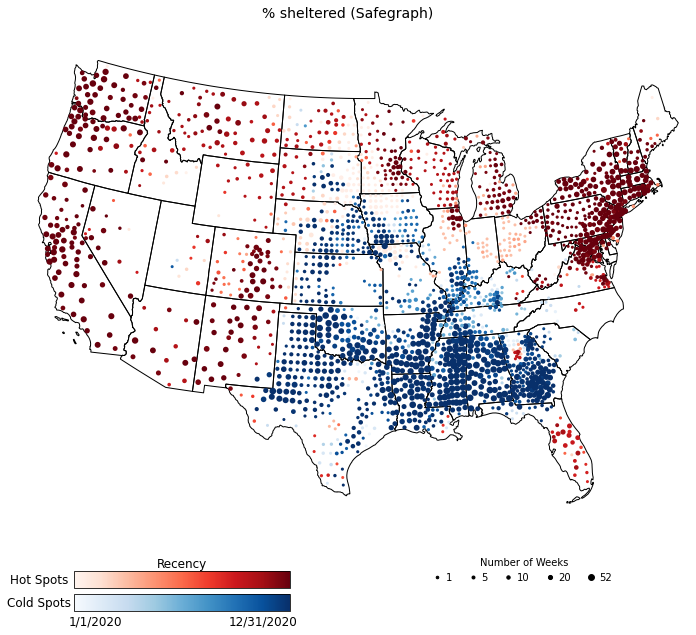

In [6]:
choro = StackedChoropleth(
    usa_map,
    data_usa,
    columns[0],
    main_folder="../test_figures",
    titles=titles[0]
)

# This should display an image in your ntoebook and save it under tests_figures/combined/
choro.plot_both()